In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import METRICS, CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS, read_files,\
    top_mean_dev_auc, top_min_whole_validation_auc, top_min_dev_auc, read_files

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
files = ['./experiments/good-20shuffle-3seed.pkl']

In [5]:
top_k = 100000
min_iterations = 50

In [6]:
best_mean_dev = top_mean_dev_auc(read_files(files), top_k)\
    .pipe(lambda x: x[x.groupby(['file', 'experiment_id']).iteration.transform('size') > min_iterations])
best_mean_dev.groupby(['file', 'experiment_id']).ngroups

288

In [7]:
best_min_dev = top_min_dev_auc(read_files(files), top_k)\
    .pipe(lambda x: x[x.groupby(['file', 'experiment_id']).iteration.transform('size') > min_iterations])
best_min_dev.groupby(['file', 'experiment_id']).ngroups

303

In [8]:
true_best = top_min_whole_validation_auc(read_files(files), top_k)\
    .pipe(lambda x: x[x.groupby(['file', 'experiment_id']).iteration.transform('size') > min_iterations])
true_best.groupby(['file', 'experiment_id']).ngroups

317

In [9]:
compare_columns = ['mean_dev_auc', 'mean_validation_auc',
               'mean_whole_validation_auc', 'min_dev_auc', 'min_validation_auc', 'min_whole_validation_auc']

In [10]:
best_mean_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,99407.0,0.834100,0.001458,0.831669,0.832805,0.834016,0.835356,0.837321
mean_validation_auc,99407.0,0.807649,0.001968,0.799828,0.806187,0.807677,0.809145,0.812574
mean_whole_validation_auc,99407.0,0.807813,0.002255,0.795433,0.806415,0.807914,0.809430,0.812808
min_dev_auc,99407.0,0.809570,0.009651,0.655333,0.808866,0.810500,0.811582,0.815868
min_validation_auc,99407.0,0.803538,0.010646,0.634350,0.802464,0.804252,0.806108,0.810290
min_whole_validation_auc,99407.0,0.807184,0.002338,0.792570,0.805832,0.807369,0.808830,0.812444


In [11]:
best_mean_dev.min_whole_validation_auc.corr(best_mean_dev.mean_dev_auc, method='spearman')

0.32968998169159547

In [12]:
best_mean_dev.mean_whole_validation_auc.corr(best_mean_dev.mean_dev_auc, method='spearman')

0.29037462134833203

In [13]:
best_min_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,98921.0,0.833249,0.002406,0.825571,0.831579,0.833649,0.835307,0.837321
mean_validation_auc,98921.0,0.807357,0.002235,0.798770,0.805959,0.807485,0.809031,0.812574
mean_whole_validation_auc,98921.0,0.807223,0.003614,0.782489,0.806007,0.807732,0.809322,0.812808
min_dev_auc,98921.0,0.810845,0.001304,0.808900,0.809819,0.810615,0.811643,0.815868
min_validation_auc,98921.0,0.803944,0.003120,0.783920,0.802485,0.804213,0.806062,0.810290
min_whole_validation_auc,98921.0,0.806515,0.003790,0.779522,0.805337,0.807177,0.808716,0.812444


In [14]:
best_min_dev.min_whole_validation_auc.corr(best_min_dev.min_dev_auc, method='spearman')

0.4199418398230136

In [15]:
best_min_dev.min_whole_validation_auc.corr(best_min_dev.mean_dev_auc, method='spearman')

0.5431134761616782

In [16]:
true_best[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,98723.0,0.831763,0.013186,0.500000,0.829935,0.832985,0.835024,0.837321
mean_validation_auc,98723.0,0.807360,0.012030,0.500000,0.806785,0.808066,0.809245,0.812574
mean_whole_validation_auc,98723.0,0.808993,0.001294,0.806533,0.807926,0.808886,0.809918,0.812808
min_dev_auc,98723.0,0.807686,0.015964,0.500000,0.806686,0.809795,0.811330,0.815868
min_validation_auc,98723.0,0.803077,0.016015,0.500000,0.802998,0.804750,0.806390,0.810290
min_whole_validation_auc,98723.0,0.808416,0.001280,0.806533,0.807360,0.808225,0.809272,0.812655


In [17]:
true_best.min_whole_validation_auc.corr(true_best.min_dev_auc, method='spearman')

0.24084002171292807

In [18]:
true_best.min_whole_validation_auc.corr(true_best.mean_dev_auc, method='spearman')

0.22236045199528862

In [19]:
true_best.mean_whole_validation_auc.corr(true_best.min_dev_auc, method='spearman')

0.20132715021533437

In [20]:
true_best.mean_whole_validation_auc.corr(true_best.mean_dev_auc, method='spearman')

0.16725994899271682

In [21]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

217

In [22]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(63187, 119)

In [23]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

207

In [24]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(58336, 119)

In [25]:
best = best_mean_dev

In [26]:
best.shape

(99407, 61)

In [27]:
best.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

count      mean       std  \
param_is_unbalance param_boost_from_average                                
False              False                     25655.0  0.807409  0.002356   
                   True                      22394.0  0.806785  0.002321   
True               False                     29418.0  0.807344  0.002424   
                   True                      21940.0  0.807115  0.002155   

                                                  min       25%       50%  \
param_is_unbalance param_boost_from_average                                 
False              False                     0.795896  0.806107  0.807518   
                   True                      0.796764  0.805396  0.806805   
True               False                     0.792570  0.805942  0.807724   
                   True                      0.797991  0.805867  0.807411   

                                                  75%       max  
param_is_unbalance param_boost_from_average                      
False              False                     0.809044  0.812363  
                   True                      0.808315  0.812444  
True               False                     0.809097  0.811952  
                   True                      0.808625  0.811940

In [28]:
best.groupby(SET_PARAMETERS + ['file', 'experiment_id']).size().groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       74
                    True                        66
True                False                       83
                    True                        65
dtype: int64

In [29]:
best['param_bagging_enable'] = (best.param_bagging_freq != 0)

best.groupby('param_bagging_enable').size()

param_bagging_enable
False    64147
True     35260
dtype: int64

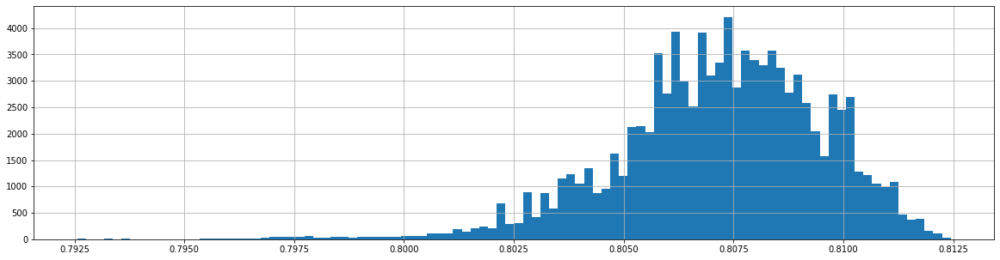

In [30]:
best.min_whole_validation_auc.hist(bins=100);

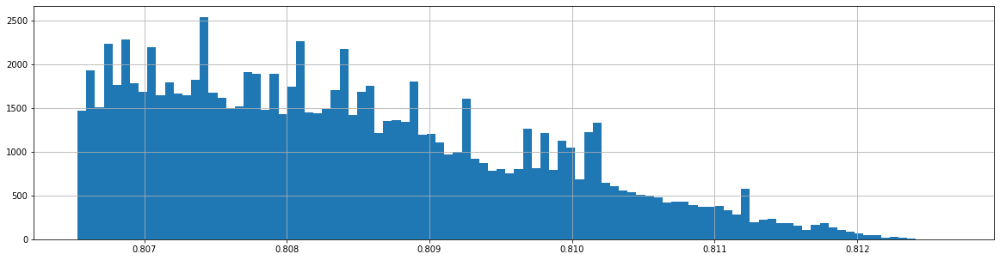

In [31]:
true_best.min_whole_validation_auc.hist(bins=100);

In [32]:
best_iteration = best.sort_values('mean_dev_auc').groupby(['file', 'experiment_id']).last()

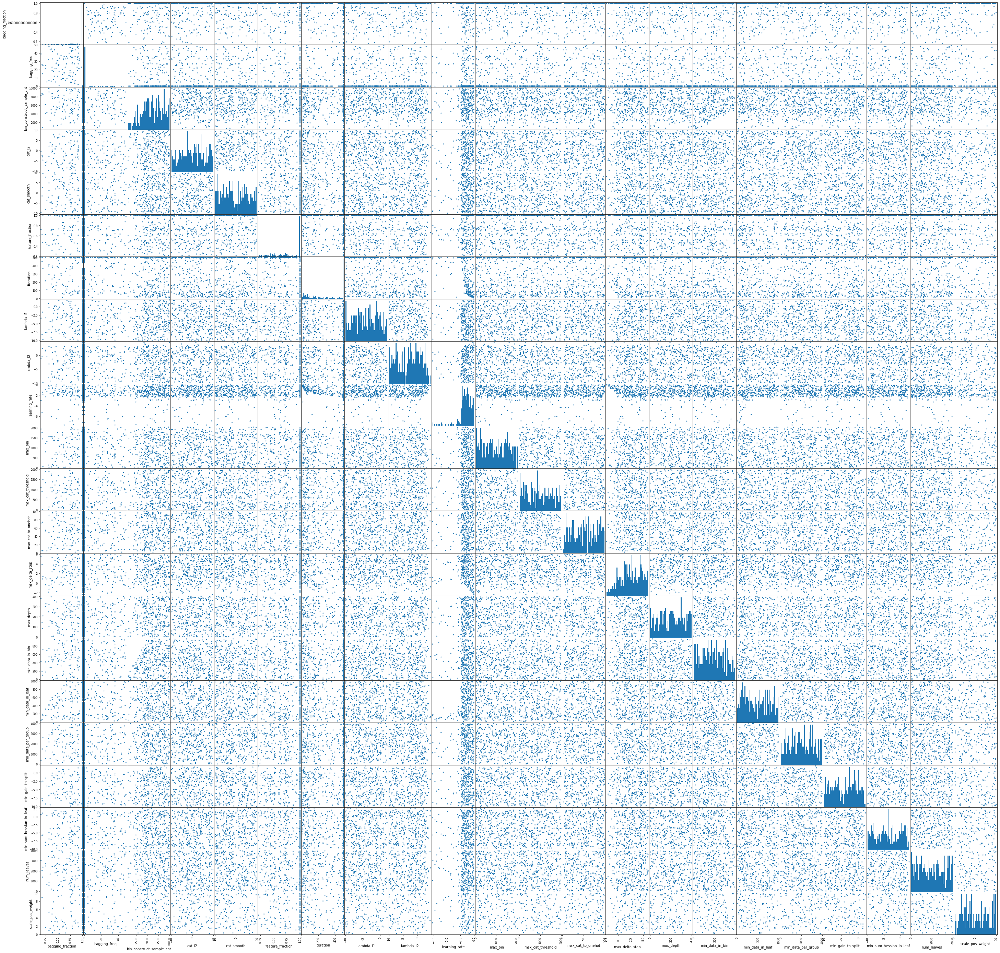

In [33]:
pd.plotting.scatter_matrix(
    pd.concat([best_iteration[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log10(best_iteration[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns').sort_index(axis=1),
    alpha=1, figsize=(50, 50), hist_kwds={'bins': 50});

### check failures in best selected parameter range

In [34]:
best_range = best\
    [[c for c in best.columns if c.startswith('param_') and not c in SET_PARAMETERS]]\
    .drop(columns=['param_seed', 'param_bagging_enable'])\
    .quantile([0, 1]).T
best_range

,0.0,1.0
param_bagging_fraction,1.541503e-01,1.000000e+00
param_bagging_freq,0.000000e+00,4.900000e+01
param_bin_construct_sample_cnt,5.660000e+02,9.997000e+03
param_cat_l2,1.091629e-10,5.597769e+09
param_cat_smooth,1.033252e-10,5.324188e+09
param_feature_fraction,2.123181e-01,1.000000e+00
param_lambda_l1,1.082472e-10,9.145999e+01
param_lambda_l2,1.195732e-10,4.285832e+04
param_learning_rate,2.113247e-08,9.939834e-01
param_max_bin,2.000000e+01,2.047000e+03


In [35]:
dfs = []
for f in files:
    df = pd.read_pickle(f).assign(file=f)
    for (n, l, h) in best_range.itertuples():
        df = df[(((df[n] >= l) & (df[n] <= h))
                 | df[n].isna())].copy()
    dfs.append(df)

limited = pd.concat(dfs, ignore_index=True, sort=True)
del dfs
limited.shape

(830500, 61)

In [36]:
limited_best_iteration = limited.sort_values('min_whole_validation_auc').groupby(['file', 'experiment_id']).last()
limited_best_iteration.shape

(1661, 59)

In [37]:
limited_best_iteration['param_bagging_enable'] = (limited_best_iteration.param_bagging_freq != 0)

In [38]:
limited_best_iteration.min_whole_validation_auc.describe()

count    1661.000000
mean        0.756105
std         0.083476
min         0.500000
25%         0.747751
50%         0.791227
75%         0.805775
max         0.812655
Name: min_whole_validation_auc, dtype: float64

In [39]:
limited_bad = limited_best_iteration[limited_best_iteration.min_whole_validation_auc < 0.6]

In [40]:
limited_bad.shape

(127, 60)

TODO pikachu with bruises reaction

In [41]:
limited_bad.groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       35
                    True                        57
True                False                        9
                    True                        26
dtype: int64

In [42]:
limited_bad.groupby('param_bagging_enable').size()

param_bagging_enable
False    33
True     94
dtype: int64

In [43]:
limited_best_iteration.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

count      mean       std  min  \
param_is_unbalance param_boost_from_average                                   
False              False                     398.0  0.753062  0.088152  0.5   
                   True                      416.0  0.736425  0.104284  0.5   
True               False                     414.0  0.777704  0.051510  0.5   
                   True                      433.0  0.757159  0.076299  0.5   

                                                  25%       50%       75%  \
param_is_unbalance param_boost_from_average                                 
False              False                     0.736610  0.791840  0.805920   
                   True                      0.716089  0.789803  0.805900   
True               False                     0.771987  0.794989  0.805767   
                   True                      0.735388  0.789278  0.805041   

                                                  max  
param_is_unbalance param_boost_from_average            
False              False                     0.812363  
                   True                      0.812444  
True               False                     0.811952  
                   True                      0.812655

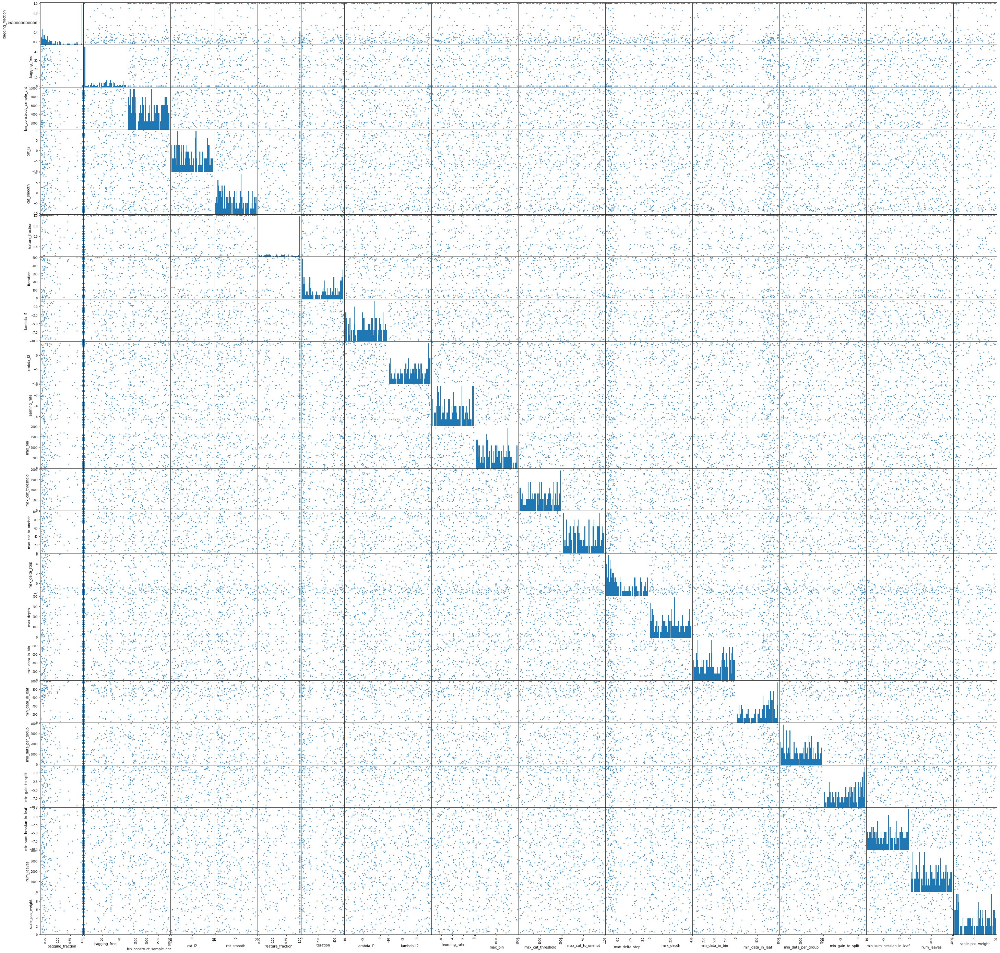

In [44]:
pd.plotting.scatter_matrix(
    pd.concat([limited_bad[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log10(limited_bad[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns').sort_index(axis=1),
    alpha=0.8, figsize=(50, 50), hist_kwds={'bins': 50});

### top parameters

In [45]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(best_iteration.sort_values('mean_dev_auc', ascending=False).head().T)

file                                 ./experiments/good-20shuffle-3seed.pkl  \
experiment_id                                                          4088   
cnt                                                                       3   
iteration                                                                37   
max_dev_auc                                                        0.857391   
max_dev_binary_logloss                                             0.730693   
max_overfit_auc                                                   0.0329594   
max_overfit_binary_logloss                                        0.0362051   
max_validation_auc                                                 0.811116   
max_validation_binary_logloss                                      0.736212   
max_whole_train_auc                                                0.841573   
max_whole_train_binary_logloss                                     0.679234   
max_whole_validation_auc                            